In [2]:
import umap, pywt, random, math, librosa
from sklearn.datasets import load_digits 
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler 
from scipy.stats import *
import numpy as np 
import pandas as pd 
import umap.plot as uplot 
import matplotlib.pyplot as plt 
from glob import glob 
from scipy.signal import * 
from matplotlib import * 
from sklearn.preprocessing import MinMaxScaler 
from mpl_toolkits.mplot3d import Axes3D 

%matplotlib notebook 

/Users/geise/opt/anaconda3/lib/python3.7/site-packages/dask/dataframe/utils.py:14: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
plt.rcParams['font.size'] = '16' 

markers = [['fle', 'fax'], ['fle', 'ttc'], ['fax', 'ttc'], ['fle', 'fax', 'ttc']]    

colors_user = { 
                  1: [0.3021056001056926, 0.7832715841230662, 0.5248299866830695], 
                  3: [0.9527513693437027, 0.33574695964633355, 0.23162637985060544], 
                  5: [0.978861150377265, 0.7337089528876308, 0.9575879003517658], 
                  6: [0.4069122470688341, 0.23550664624483106, 0.9243285294840433], 
                  7: [0.7016180131718597, 0.9583713584909251, 0.20373506203152764], 
                  9: [0.20113611787974311, 0.2694618990391036, 0.25152567357972605], 
                  11: [0.6006638621570457, 0.9603844726070587, 0.8276636736408906], 
                  12: [0.7433226175501522, 0.47829016393016416, 0.7557626199776131], 
                  13: [0.9247504884205391, 0.7815881652541353, 0.4579406092000745], 
                  14: [0.5432276544230499, 0.5166835517062601, 0.3235060129850579], 
                  15: [0.43935313857647673, 0.7505969286137386, 0.9884875722471907], 
                  16: [0.20193671791887882, 0.5067215195996487, 0.8111300708512197], 
                  17: [0.7654924061972502, 0.22119287518147956, 0.46865142688942835], 
                  18: [0.9531384138356103, 0.24823310634650317, 0.927235688757792], 
                  19: [0.23266482643407427, 0.9443346964154495, 0.28147743493933347], 
                  21: [0.24482530831423918, 0.30541921644002673, 0.6104382199047904], 
                  22: [0.6530191200309681, 0.7135466741738102, 0.6469466989144333], 
                  23: [0.5652430290844275, 0.8556177114398361, 0.391415703512179], 
                  24: [0.6137936554192226, 0.3645232192477835, 0.9960589391590938], 
                  25: [0.9691754138434107, 0.9971554756000204, 0.7218114650220747], 
                  26: [0.2559960060762984, 0.8943110590759886, 0.8429931957464554], 
                  27: [0.3423154476494461, 0.6437413423070617, 0.22655334791110232], 
                  28: [0.9849849177750087, 0.3691208082582399, 0.5818514434110449], 
                  29: [0.5546134806514317, 0.24071952755126153, 0.2102637811362838], 
                  30: [0.8813060118847545, 0.68931930048407, 0.20534857195723424] 
            }


In [4]:
def zero_pole_filter(f, fs):
    w = (2*math.pi*f)/fs
    r = 0.9
    z0 = [math.cos(w), math.sin(w)]
    zp = [r*math.cos(w), r*math.sin(w)]
    b = [1, -2*z0[0], (z0[0]*z0[0])+(z0[1]*z0[1])]
    a = [1, -2*zp[0], (zp[0]*zp[0])+(zp[1]*zp[1])]
    return b, a

def high_pass_filter(data, Fs):
    ndata = np.copy(data)
    b, a =  zero_pole_filter(0, Fs)
    for i in range(data.shape[1]):
        ndata[:, i] = lfilter(b, a, ndata[:, i])
    return ndata

def low_pass_filter(data, Fs, lowcut):
    ndata = np.copy(data)
    b = firwin(numtaps=32, cutoff=lowcut, nyq=Fs/2.0)
    for i in range(data.shape[1]):
        ndata[:, i] = lfilter(b, 1, ndata[:, i])
    return ndata

In [5]:
def plot_embeddings(dic_embeddings, order_plot):
    for key in order_plot: 
        embedding = dic_embeddings[key][:, 2:] 
        labels = dic_embeddings[key][:, 0] 

        plt.figure(figsize=(12, 8)) 
        plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='nipy_spectral', s=20) 
        plt.gca().set_aspect('equal', 'datalim') 
        plt.colorbar(boundaries=np.append(np.unique(labels), labels[-1]+1)-0.5).set_ticks(np.unique(labels)) 
        plt.title(key) 


In [6]:
def get_embeddings(files, feat='time', mode='u', n=10, dist=0.1, metric='euclidean', n_epochs=500, n_components=2, markers_set=[], **kwargs):
    dic_embeddings = {} 
    dic_data = {} 
    
    for f in files: 
        if(f.endswith('.csv')):
            data = np.loadtxt(f, delimiter=',') 
        elif(f.endswith('.npz')):
            data = np.load(f) 
            data = data[data.files[0]]
        labels = data[:, 0].astype(int) 
        days = data[:, 1].astype(int) 
        parts_f = os.path.basename(f).split('.')[0].split('_')
        if(len(parts_f) > 3):
            key = parts_f[1]+'_'+parts_f[2]
        else:
            key = parts_f[1] 
        
        if(feat=='time'):
            features = np.copy(data[:, 2:])
        elif(feat=='stf'):
            spectograms = np.abs(stft(data[:, 2:], fs=100, window='hann', nperseg=64, return_onesided=True, axis=1)[-1]) 
            features = np.vstack((np.dstack((spectograms)))).T
        elif(feat=='freq'):
            if('cut_freq' in kwargs):
                mag = np.abs(np.fft.fft(data[:, 2:], axis=1))
                freq = np.fft.fftfreq(mag.shape[1], d=1/100)[:round(mag.shape[1]/2)]
                if(kwargs["pass_filter"] == 'low'):
                    idxs_valid = np.where(freq < kwargs["cut_freq"])[0]
                elif(kwargs["pass_filter"] == 'high'): 
                    idxs_valid = np.where(freq > kwargs["cut_freq"])[0]
                else:
                    idxs_valid = np.where(freq > kwargs["cut_freq"][0])[0]
                    idxs_valid = idxs_valid[np.where(freq[idxs_valid] < kwargs["cut_freq"][1])[0]]
                features = mag[:, idxs_valid]
                freq = freq[idxs_valid] 
            else:
                features = np.abs(np.fft.fft(data[:, 2:], axis=1))[:, :round((data.shape[1]-2)/2)]  
            
        dic_data[key] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], features)) 
        reducer = umap.UMAP(random_state=1, n_components=n_components, n_neighbors=n, metric=metric, min_dist=dist, n_epochs=n_epochs)
        
        if(mode=='u'):
            embedding = reducer.fit_transform(features)
            dic_embeddings[key] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], embedding))
        elif(mode=='s'):
            idxs_train = np.where(days==1)[0]
            idxs_test = np.where(days==2)[0]
            embedding_train = reducer.fit_transform(features[idxs_train], y=labels[idxs_train]) 
            embedding_test = reducer.transform(features[idxs_test])
            dic_embeddings[key] = {}
            dic_embeddings[key]['train'] = np.hstack((labels[idxs_train, np.newaxis], days[idxs_train, np.newaxis], embedding_train)) 
            dic_embeddings[key]['test'] = np.hstack((labels[idxs_test, np.newaxis], days[idxs_test, np.newaxis], embedding_test)) 
            
    for subset in markers_set: 
        subset_name = '_'.join(subset) 
        data = np.hstack(([dic_data[key][:, 2:] for key in subset])) 
        labels = dic_data[subset[0]][:, 0].astype(int) 
        days = dic_data[subset[0]][:, 1].astype(int) 

        dic_data[subset_name] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], data)) 
        reducer = umap.UMAP(random_state=1, n_components=2, n_neighbors=n, metric=metric, min_dist=dist) 
        
        if(mode=='u'):
            embedding = reducer.fit_transform(data)
            dic_embeddings[subset_name] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], embedding))
        elif(mode=='s'):
            idxs_train = np.where(days==1)[0]
            idxs_test = np.where(days==2)[0]
            embedding_train = reducer.fit_transform(data[idxs_train], y=labels[idxs_train]) 
            embedding_test = reducer.transform(data[idxs_test])
            idxs = np.concatenate((idxs_train, idxs_test))
            embedding = np.vstack((embedding_train, embedding_test))
            dic_embeddings[subset_name] = {}
            dic_embeddings[subset_name]['train'] = np.hstack((labels[idxs_train, np.newaxis], days[idxs_train, np.newaxis], embedding_train)) 
            dic_embeddings[subset_name]['test'] = np.hstack((labels[idxs_test, np.newaxis], days[idxs_test, np.newaxis], embedding_test)) 

    return dic_embeddings, dic_data


In [21]:
!python3 generate_frames.py -p ./frames

(6166, 258)
['frames', 'imu']
imu (6166, 128)
(6173, 258)
['frames', 'ttc']
ttc (6173, 128)
(6173, 258)
['frames', 'ias']
ias (6173, 128)
(6173, 258)
['frames', 'fax']
fax (6173, 128)
(6166, 258)
['frames', 'nexus']
nexus (6166, 128)
(6173, 258)
['frames', 'fme']
fme (6173, 128)
(6173, 258)
['frames', 'ftc']
ftc (6173, 128)
(6173, 258)
['frames', 'fle']
fle (6173, 128)


<IPython.core.display.Javascript object>


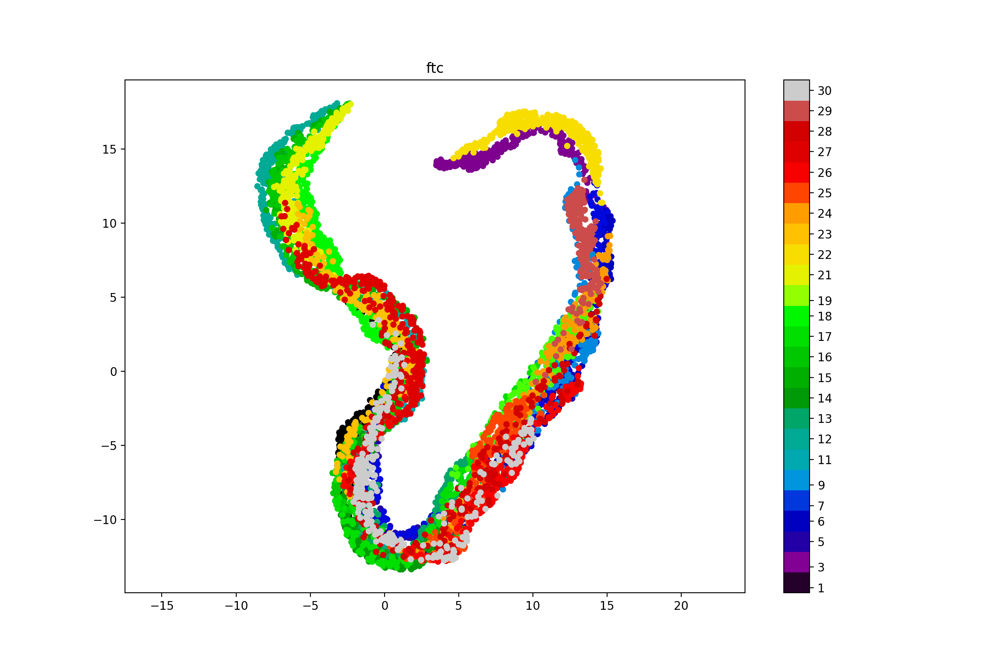

<IPython.core.display.Javascript object>


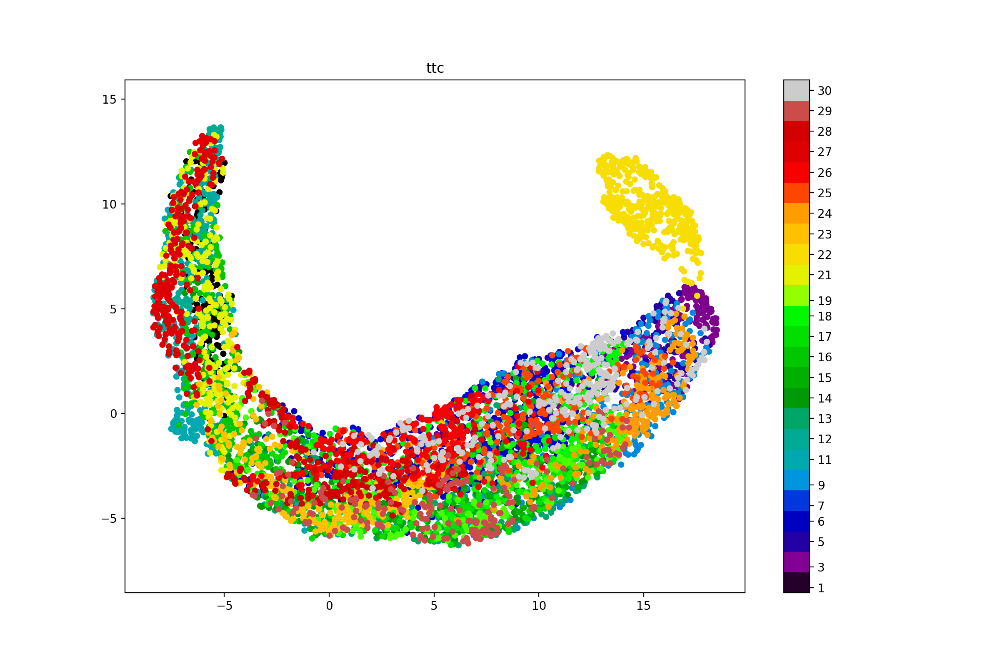

<IPython.core.display.Javascript object>


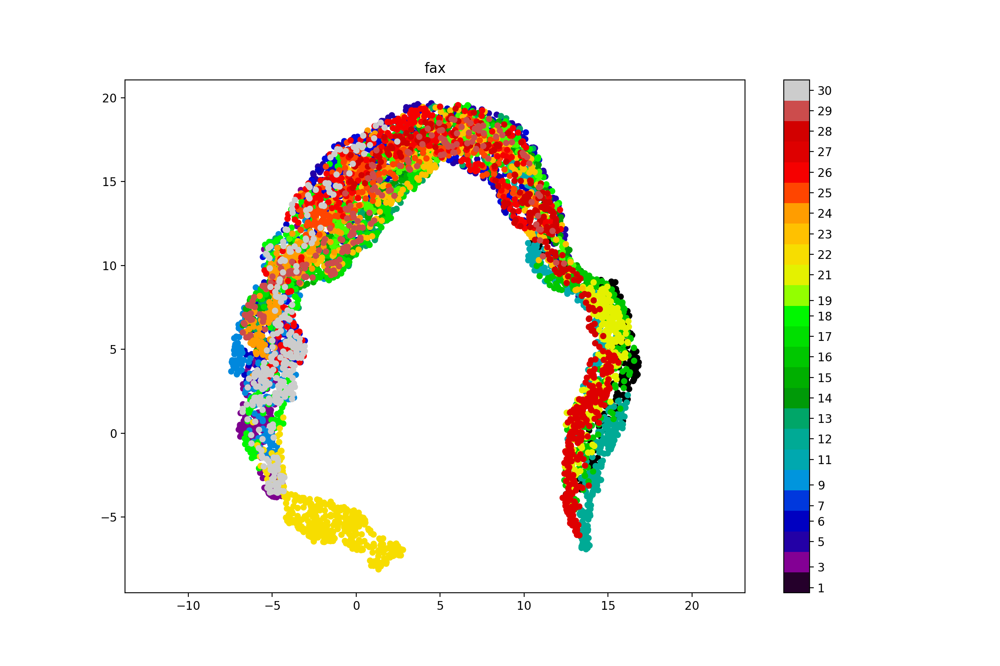

<IPython.core.display.Javascript object>


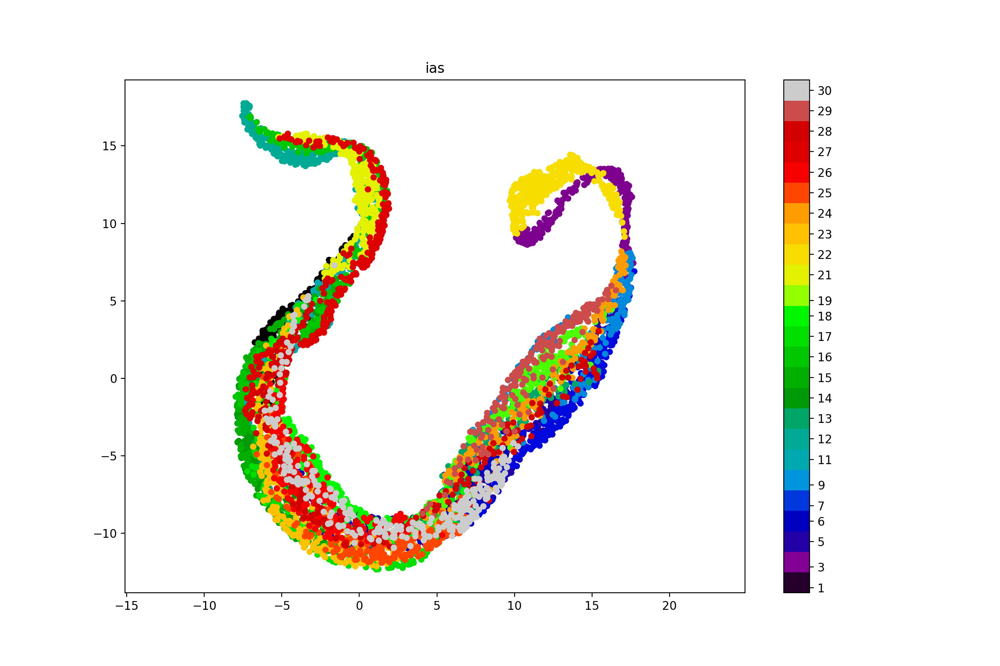

<IPython.core.display.Javascript object>


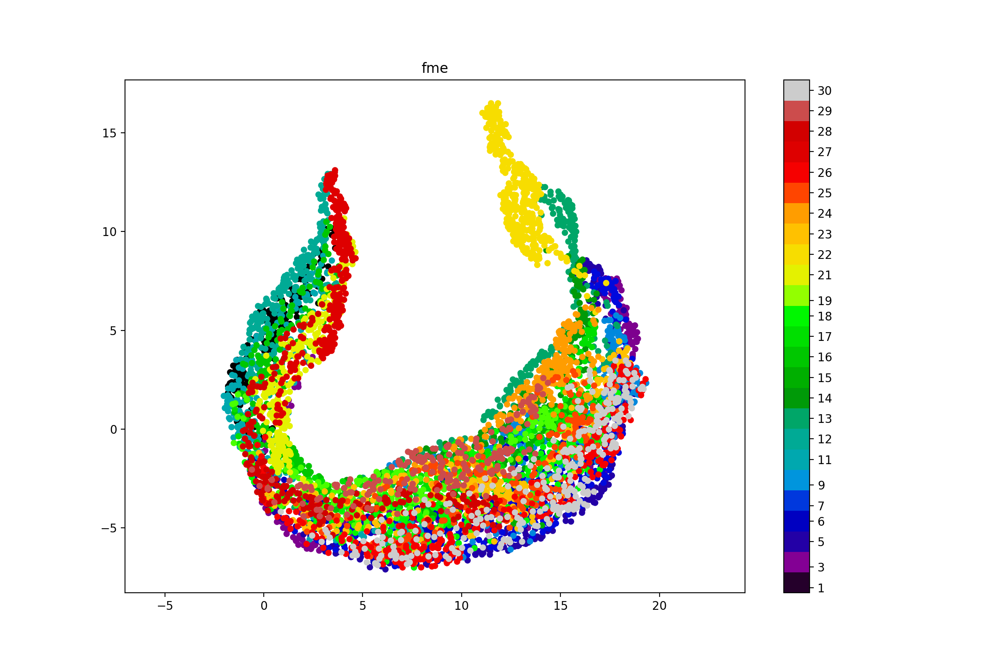

<IPython.core.display.Javascript object>


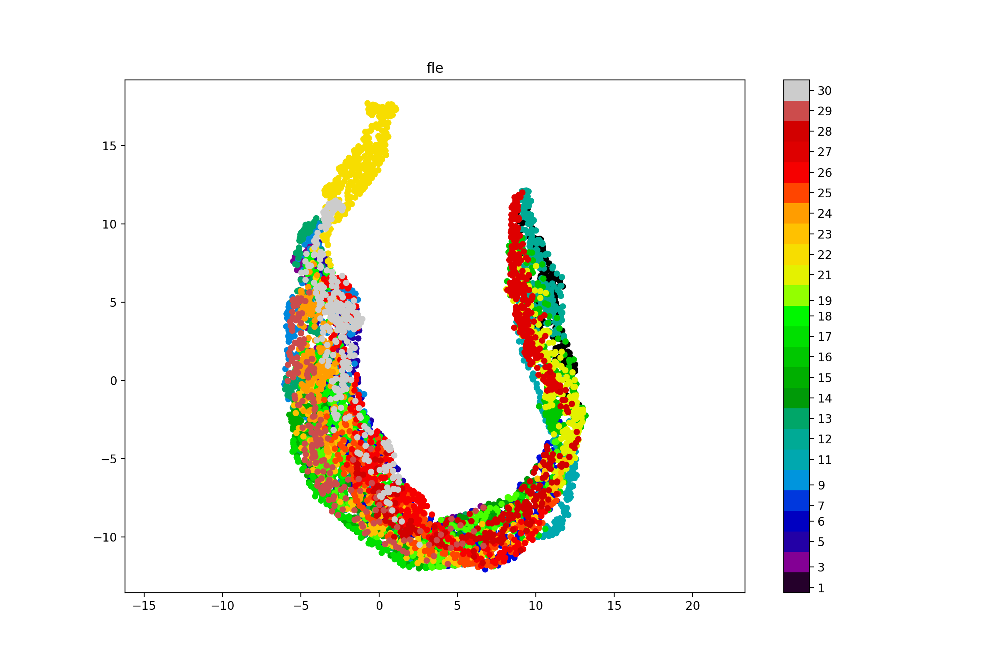

<IPython.core.display.Javascript object>


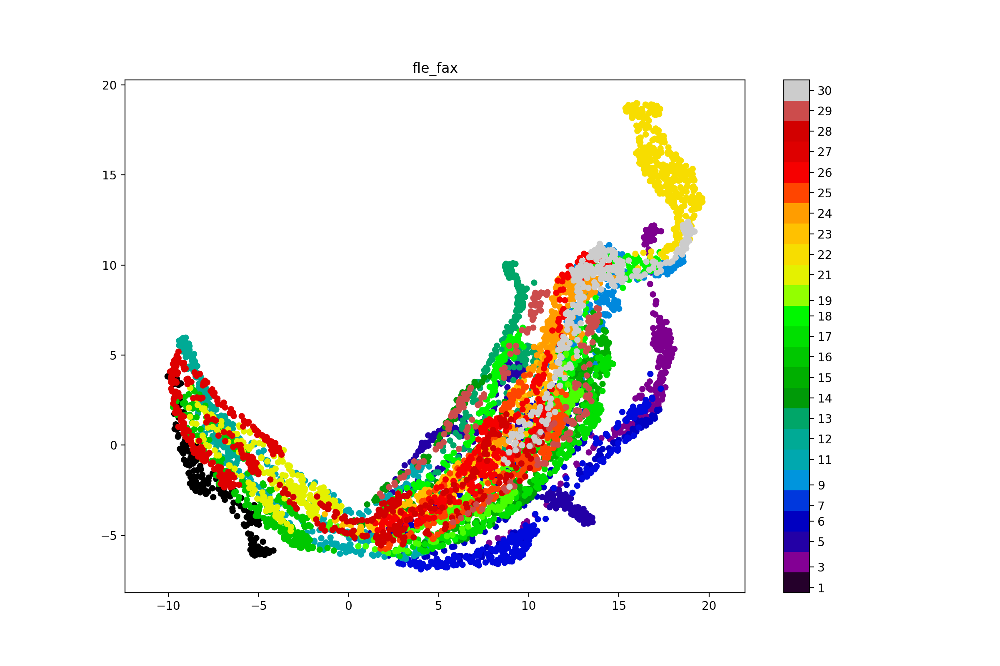

<IPython.core.display.Javascript object>


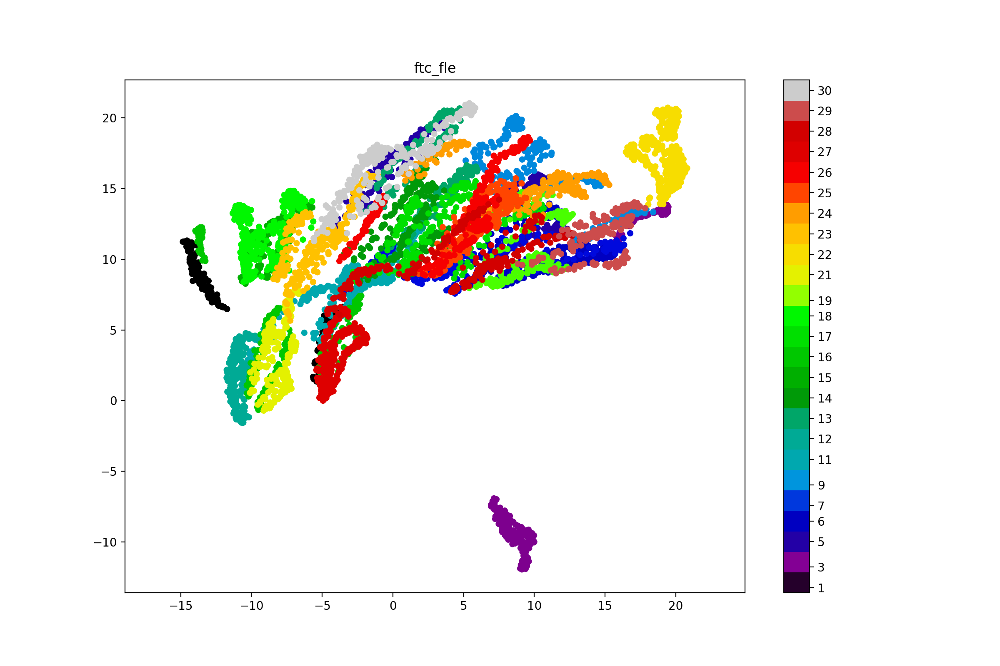

<IPython.core.display.Javascript object>


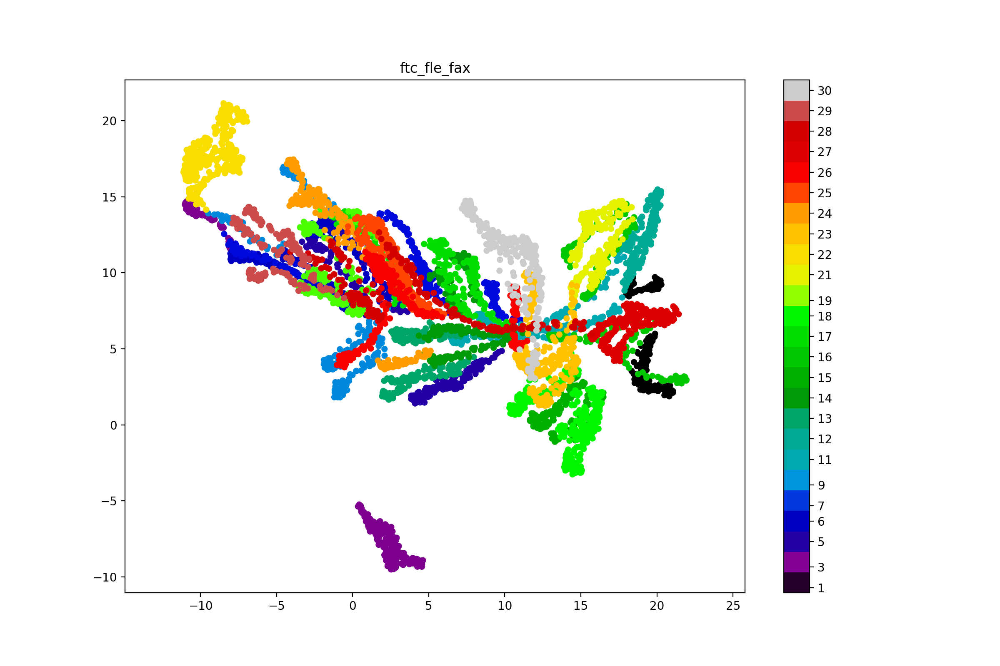

<IPython.core.display.Javascript object>


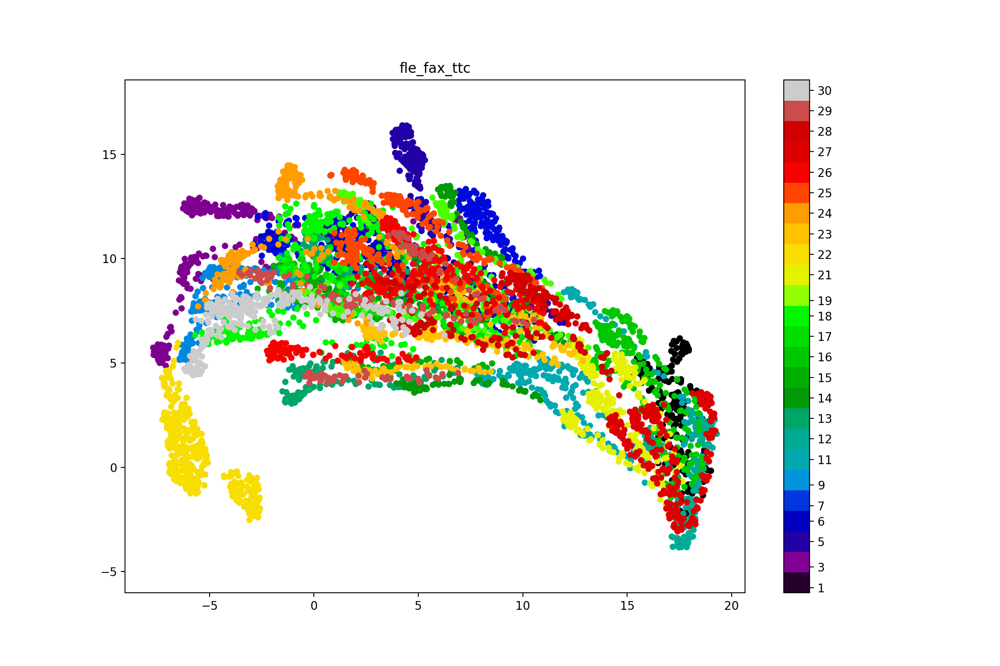

<IPython.core.display.Javascript object>


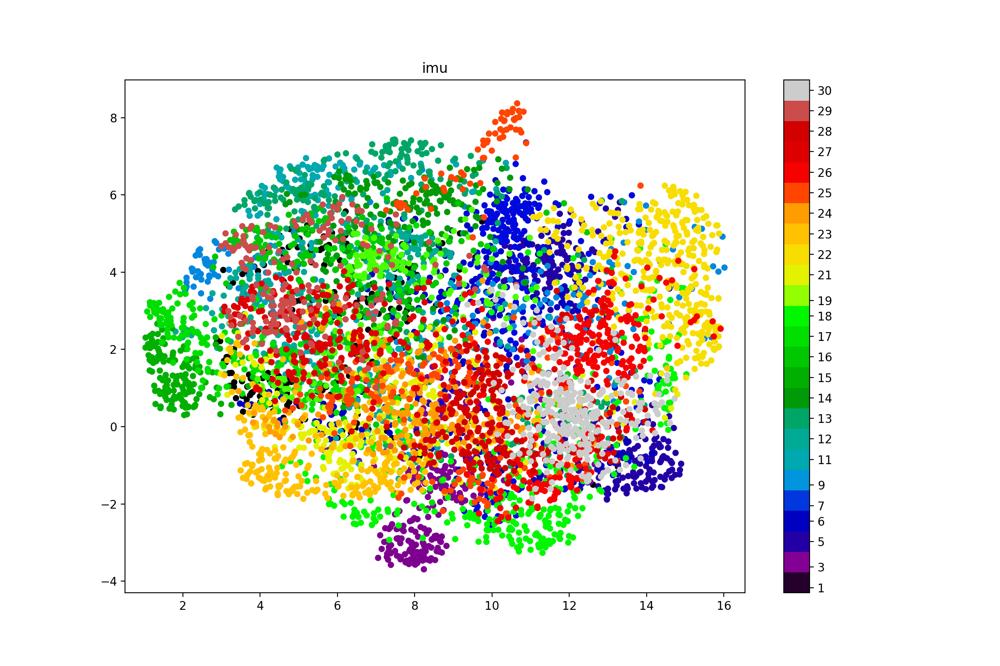

<IPython.core.display.Javascript object>


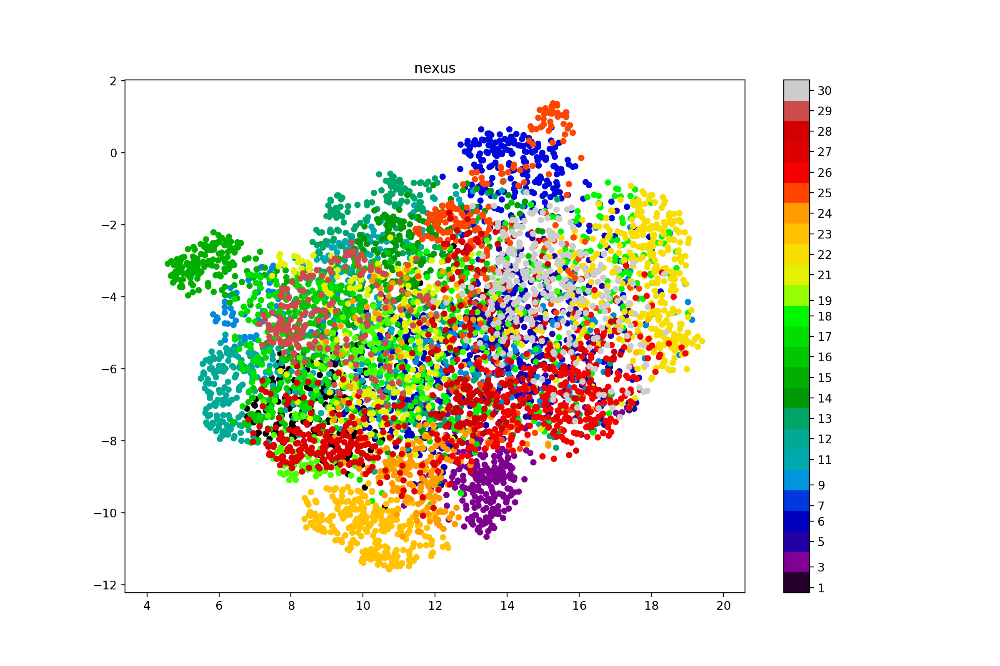

In [28]:
markers = [['fle', 'fax'], ['ftc', 'fle'], ['ftc', 'fle', 'fax'], ['fle', 'fax', 'ttc']]
files = glob("frames/*.csv")
dic_embeddings, dic_data = get_embeddings(files, feat='freq', mode='u', n=100, dist=0.8, markers_set=markers)

list_acc = ['imu', 'nexus'] 
list_concat = ['_'.join(m) for m in markers] 
list_markers = list(set(list(dic_embeddings.keys())) - set(list_acc) - set(set(list_concat)))  
order_plot = np.concatenate((list_markers, list_concat, list_acc)) 

plot_embeddings(dic_embeddings, order_plot)


In [29]:
!python3 generate_frames.py -p ./frames -d 1

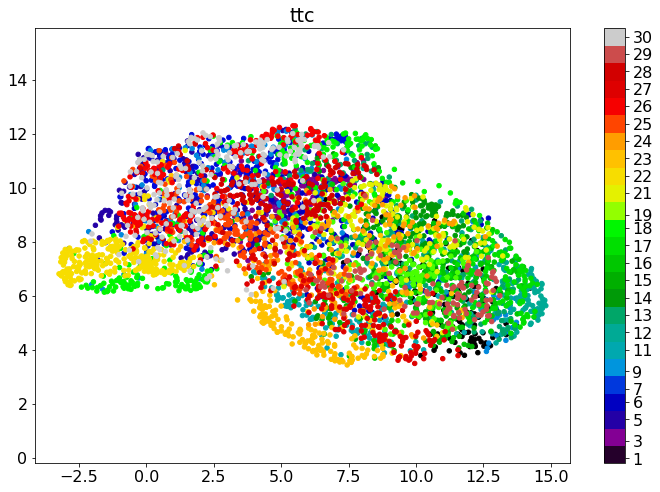

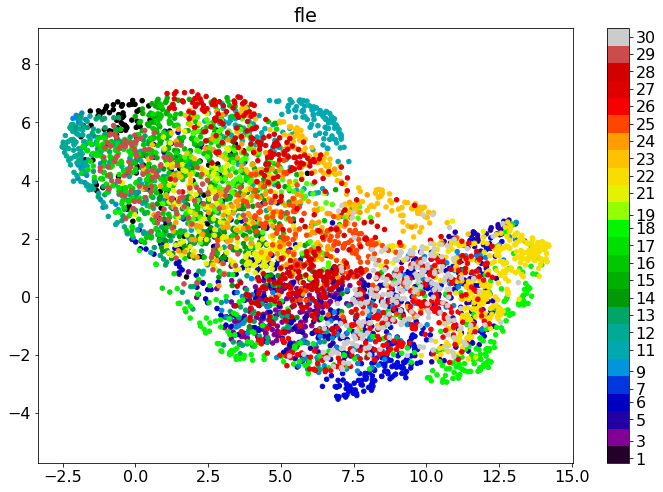

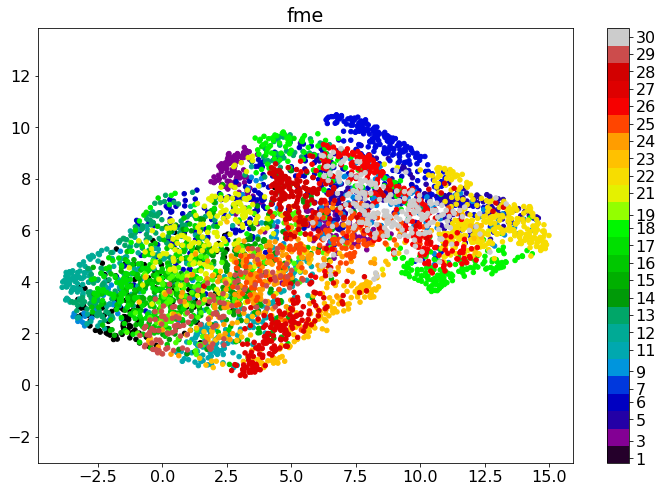

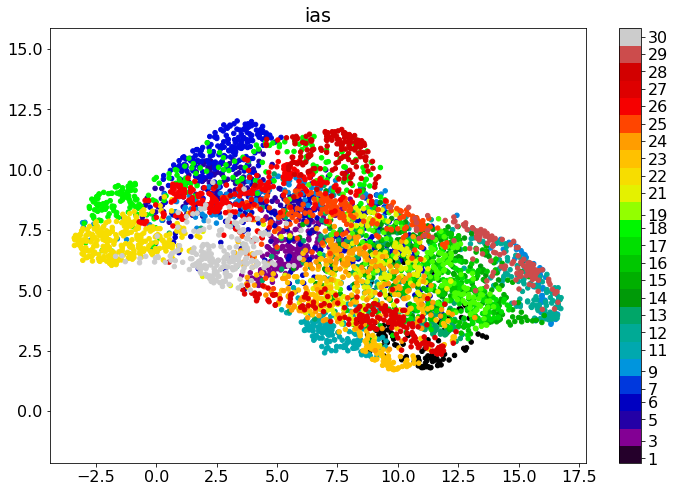

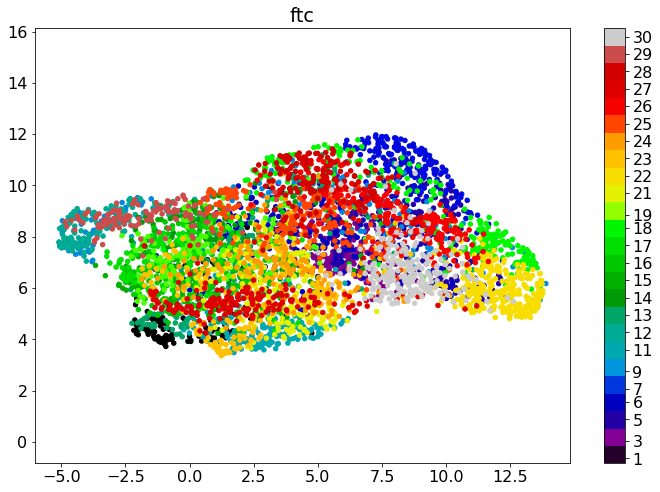

...

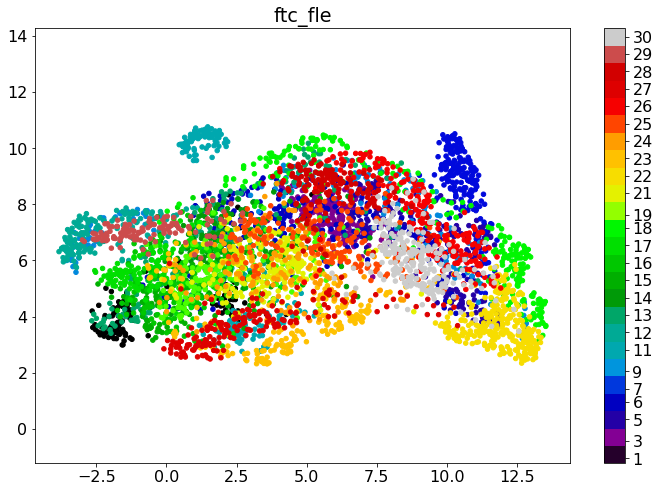

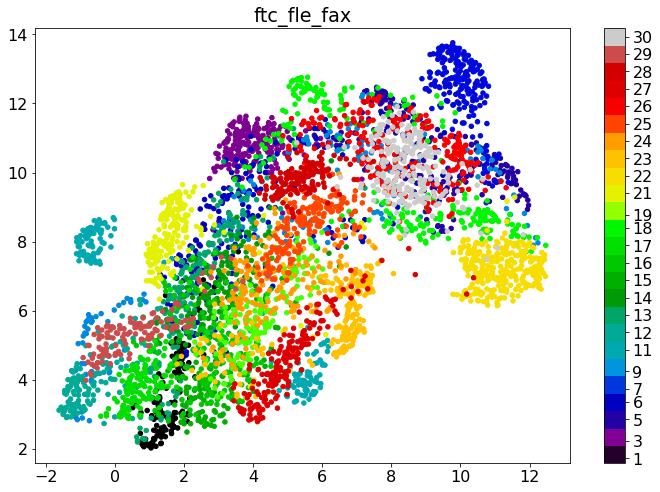

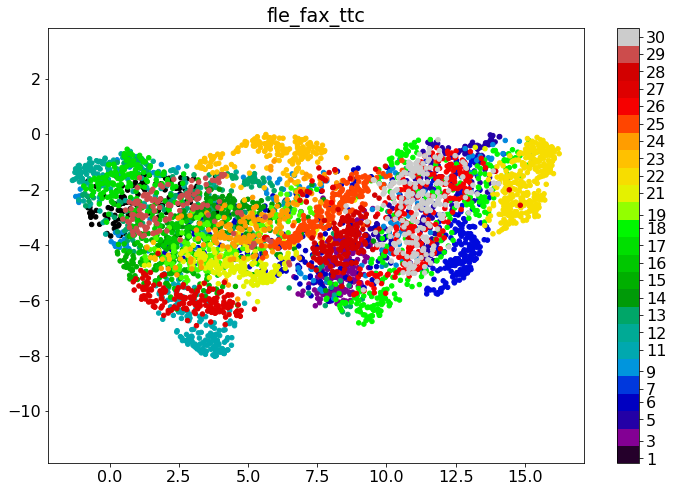

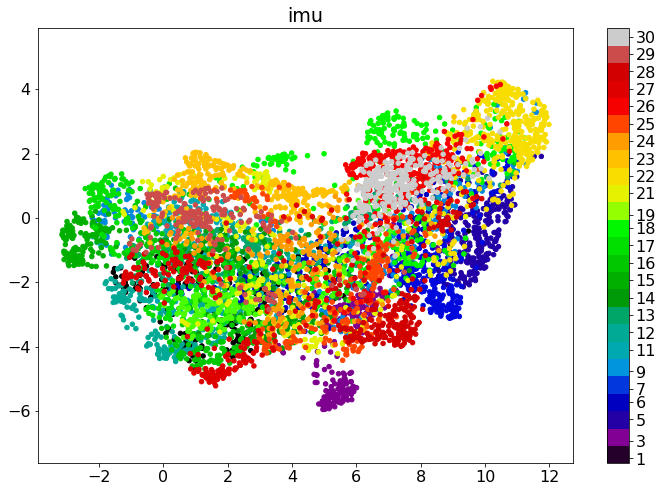

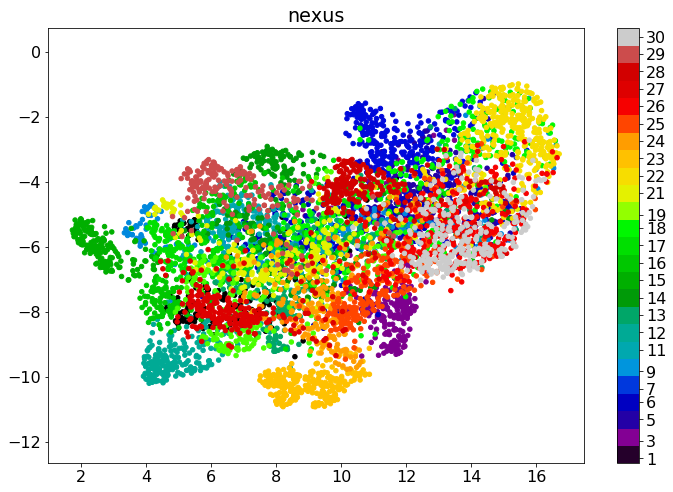

In [9]:
markers = [['fle', 'fax'], ['ftc', 'fle'], ['ftc', 'fle', 'fax'], ['fle', 'fax', 'ttc']]
files = glob("frames/*.csv")
dic_embeddings, dic_data = get_embeddings(files, feat='freq', mode='u', n=50, dist=0.5, markers_set=markers)

list_acc = ['imu', 'nexus'] 
list_concat = ['_'.join(m) for m in markers] 
list_markers = list(set(list(dic_embeddings.keys())) - set(list_acc) - set(set(list_concat)))  
order_plot = np.concatenate((list_markers, list_concat, list_acc)) 

plot_embeddings(dic_embeddings, order_plot)


In [10]:
def generate_pairs(dic_data):
    users = dic_data[list(dic_data.keys())[0]][:, 0].astype(int)
    all_users = np.unique(users)
    np.random.seed(0)
    users_set1 = np.random.choice(all_users, 13, replace=False)
    users_set2 = [u for u in all_users if u not in users_set1]

    idxs_pos = {}
    idxs_neg = {}
    for key in sorted(dic_data.keys()):
        sensor_data = dic_data[key][:, 2:]
        users = dic_data[key][:, 0].astype(int)

        pairs = np.empty((0, 2*sensor_data.shape[1]+2))
        for s, users_set in enumerate([users_set1, users_set2]):
            for idxu, u in enumerate(users_set):
                ratio = 0.5
                users_n = np.delete(users_set, idxu)
                idxs_u = np.where(users==u)[0]
                np.random.seed(0)
                idxs_u_set1 = np.random.choice(np.arange(len(idxs_u)), int(len(idxs_u)*ratio), replace=False)
                np.random.seed(0)
                idxs_u_set2 = np.random.choice(np.arange(len(idxs_u)), int(len(idxs_u)*ratio), replace=False)
                pairs_pos_u = np.vstack(( [[np.concatenate(([s+1], np.abs(sensor_data[idx])*np.abs(sensor_data[i]), np.abs(sensor_data[idx])-np.abs(sensor_data[i]) )) for i in np.delete(idxs_u_set2, np.where(idxs_u_set2==idx)[0]) ] for idx in idxs_u_set1] ))

                n_neg = int(math.ceil(len(pairs_pos_u)/len(users_n)/len(idxs_u)))
                n_pos = int(math.floor(len(pairs_pos_u)/(n_neg*len(users_n))))

                np.random.seed(0)
                idxs_u = np.random.choice(idxs_u, n_pos, replace=False)

                if(u not in idxs_neg):
                    np.random.seed(0)
                    idxs_users_neg = np.concatenate(([np.random.choice(np.where(users==un)[0], n_neg, replace=False) for un in users_n]))
                    idxs_neg[u] = idxs_users_neg
                else:
                    idxs_users_neg = idxs_neg[u]

                pairs_neg_u = np.vstack(( [ np.hstack(( np.repeat([s+1], len(idxs_users_neg), axis=0)[:, np.newaxis], np.abs(np.repeat(sensor_data[i, np.newaxis], len(idxs_users_neg), axis=0))-np.abs(sensor_data[idxs_users_neg]), np.abs(np.repeat(sensor_data[i, np.newaxis], len(idxs_users_neg), axis=0))*np.abs(sensor_data[idxs_users_neg]) )) for i in idxs_u] ))
                pairs_u = np.vstack(( pairs_pos_u, pairs_neg_u ))
                labels = np.concatenate(( np.ones(len(pairs_pos_u)), np.zeros(len(pairs_neg_u)) ))
                pairs = np.vstack(( pairs, np.hstack((labels[:, np.newaxis], pairs_u)) ))
        print(pairs.shape)
        np.savez_compressed("pairs/pairs_"+key+".npz", pairs.astype(np.float32))
    

In [11]:
generate_pairs(dic_data)

(435257, 258)
(435257, 258)
(435257, 514)
(435257, 770)
(435257, 258)
(435257, 258)
(435257, 514)
(435257, 770)
(435257, 258)
(693371, 258)
(693371, 258)
(435257, 258)
